In [2089]:
from pylab import *

import skimage
from skimage import color
from skimage import exposure
from skimage import filters
from skimage import io
from skimage import util

from ipywidgets import interact, interactive, fixed, interact_manual
import ipywidgets as widgets

import numpy as np
from scipy import ndimage
import time
import numpy as np

funkcija za plotovanje ulaznih i obrađenih slika

In [2090]:
#plotovanje dve slike jednu pored druge
def pictures_plot(img1, img2):
    fig, ax = plt.subplots(ncols=2, figsize=(12,6), dpi=80); plt.tight_layout()
    ax[0].imshow(img1); ax[0].set_title('Ulazna slika'); ax[0].axis('off')
    ax[1].imshow(img2); ax[1].set_title('Slika nakon popravke kontrasta'); ax[1].axis('off');

In [2091]:
# plotovanje tri slike jednu pored druge
def pictures_plot_3(img1, img2, img3, title1, title2, title3):
    fig, ax = plt.subplots(ncols=3, figsize=(14,7), dpi=80); plt.tight_layout();
    ax[0].imshow(img1); ax[0].set_title(title1); ax[0].axis('off');
    ax[1].imshow(img2, 'gray'); ax[1].set_title(title2); ax[1].axis('off');
    ax[2].imshow(img3); ax[2].set_title(title3); ax[2].axis('off');

funkcija za plotovanje histograma ulazne i obrađene slike

In [2092]:
# funkcija koriscena u 1. i 2. delu zadatka
def hist_plot(img1, img2, title1 = 'Histogram ulazne slike', title2 = 'Histogram slike nakon popravke kontrasta'):
    hist_img_in, bin_edges = np.histogram(img1.flatten(), bins=256, range=(0,255))
    hist_img_out, bin_edges = np.histogram(img2.flatten(), bins=256, range=(0,255))

    fig, ax = plt.subplots(ncols=2, figsize=(12,4), dpi=80); plt.tight_layout()
    ax[0].bar(bin_edges[0:-1], hist_img_in, color='b'); ax[0].set_title(title1)
    ax[1].bar(bin_edges[0:-1], hist_img_out, color='r'); ax[1].set_title(title2)

# Prvi zadatak - poboljšanje kontrasta

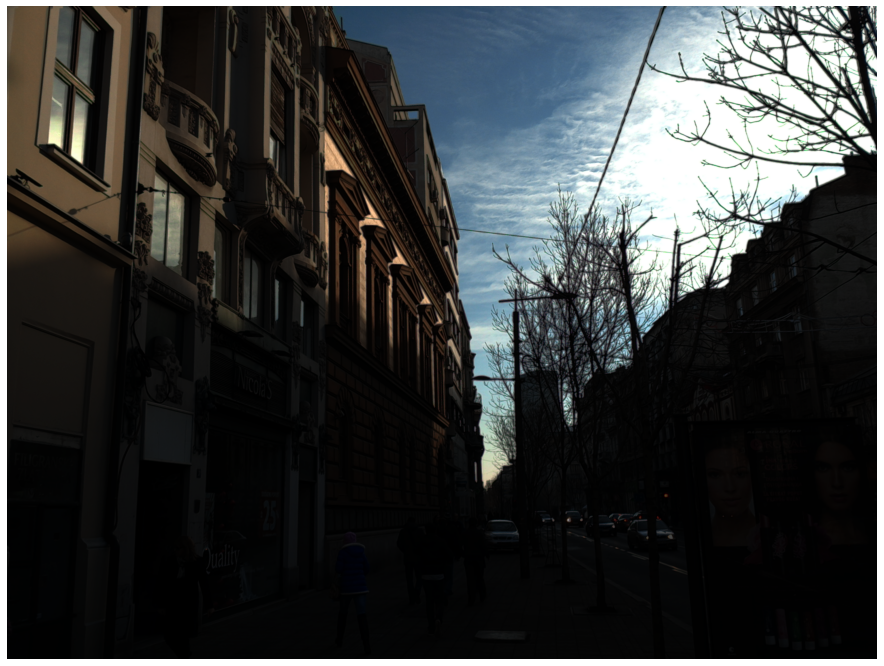

In [2093]:
# ucitavanje slike
raw_1 = io.imread('../sekvence/street.tif')
# skaliranje na opseg [0,255]
raw_1[:,:,0] = raw_1[:,:,0]/max(raw_1[:,:,0].flatten())*255
raw_1[:,:,1] = raw_1[:,:,1]/max(raw_1[:,:,1].flatten())*255
raw_1[:,:,2] = raw_1[:,:,2]/max(raw_1[:,:,2].flatten())*255
# prikaz slike
figure(figsize=(24,12))
imshow(raw_1, vmin=0, vmax=255) 
axis('off');

Prikazanu sliku karakteriše dosta tamnih piksela (u donjem delu slike) i izraziti svetli u gornjem desnom uglu slike. Za svaki kanal primećuje se isti obrazac.     
Opsezi piksela nakon skaliranja su u opsegu 0-255.           
Problemu poboljšanja kontrasta se može pristupiti na više načina - tako što se vrši popravka istog na svakom kanalu ili se slika prebaci u drugi sistem boja, pa se operacije primenjuju na jednom kanalu karakterističnom za osvetljenje.    
U prvom zadatku odlučila sam se za primenjivanje operacija na svakom kanalu posebno, a u narednim zadacima sam koristila drugi način.

### 1. Odsecanje 

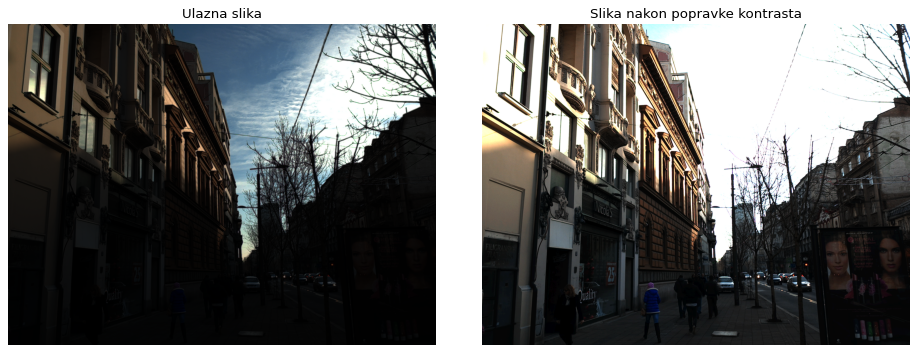

In [875]:
raw_1_rescale_intensity = raw_1.copy()

# parametri
a = 0
b = 50

# primena na svakom kanalu posebno
raw_1_rescale_intensity[:,:,0] = exposure.rescale_intensity(raw_1[:,:,0] , in_range = (a, b), out_range = (0, 255))
raw_1_rescale_intensity[:,:,1] = exposure.rescale_intensity(raw_1[:,:,1] , in_range = (a, b), out_range = (0, 255))
raw_1_rescale_intensity[:,:,2] = exposure.rescale_intensity(raw_1[:,:,2] , in_range = (a, b), out_range = (0, 255))

pictures_plot(raw_1, raw_1_rescale_intensity)

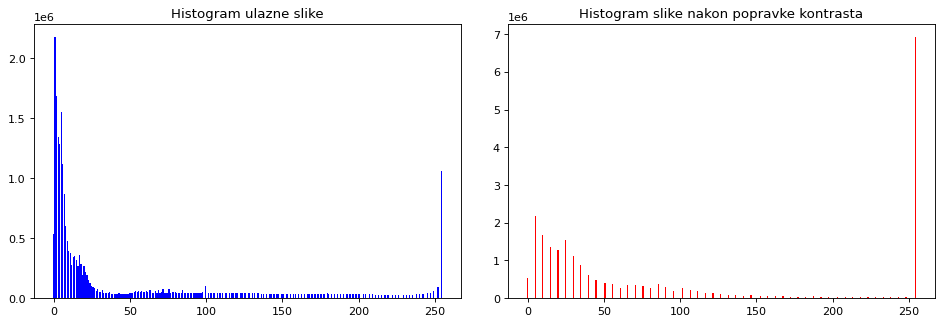

In [876]:
hist_plot(raw_1, raw_1_rescale_intensity)

Izbor parametara kod ovog vida popravke kontrasta urađen je tako što je pokušano da se opeg sa navećom zbijenošću vrednosti razvuče na celi opseg. Sa histograma ulazne slike može se opaziti da je taj opseg 0-30. Variranjem desne granice i posmatranjem rezultata i dobijene slike, izabrana je vrednost 50.

### 2. Razvlačenje kontrasta 

$$ 
s = 
     \begin{cases}
       a\cdot r, 0 \leq r < r_1\\
       b\cdot (r-r_1) + s_1, r_1 \leq r < r_2\\
       c\cdot (r-r_2) +s_2, r_2 \leq r < L-1
     \end{cases}
$$
s - vrednost izlaznog piksela, r - prethodna vrednost piksela

Parametri a, b i c se mogu izraziti preko $r_1$, $r_2$, $s_1$ i $s_2$ (tako da je samo njih potrebno podesiti)
$$ a = \frac{s_1}{r_1}, \ \ b = \frac{s_2-s_1}{r_2-r_1} \ \ i \ \ c = \frac{s_{max} - s_2}{r_{max} - r_2}$$

Kako se sa histograma i preko slike može zaključiti da veliki broj odbiraka upada u opseg jako niskih vrednosti, parametar $r_1$ je izabran tako da izdvoji taj mali skup najtamnijih piksela, a s_1 tako da izdvoji vidno veći opseg u koji će se oni preslikati. Slično tome izabrana su i ostala dva parametra.
Naravno, varijacijom oko pretpostavljeno dobrih vrednosti izabrane su optimalne.

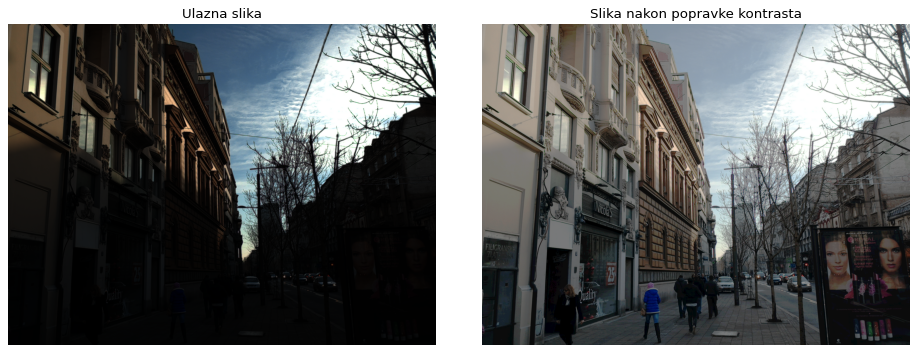

In [2094]:
#parametri
r1 = 7; r2 = 20; s1 = 80; s2 = 120

#opsezi po x i y osi
x_val = [0, r1, r2, 255]
y_val = [0, s1, s2, 255]

raw_1_linear_stretching = uint8(interp(double(raw_1), x_val, y_val))

pictures_plot(raw_1, raw_1_linear_stretching)

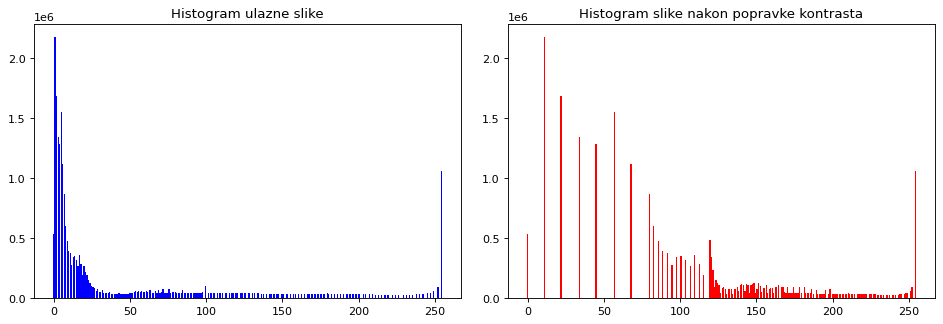

In [2095]:
hist_plot(raw_1, raw_1_linear_stretching)

### 3. Kompresija kontrasta log funkcijom

$$ v = c \cdot \log(1 + k\cdot |u|) $$
Postoje koeficijenti opsega ulaza (c) i izlaza (k), a pošto "c" zavisi od "k", pdešavamo samo "k" parametar. 
$$c = \frac{255}{\log(1 + k\cdot \text{maksimalna ulazna vrednost piksela})}$$
255 - da bismo vratili u opseg od [0,255], maksimalna ulazna vrednost piksela je 1 zato što je u samoj funkciji skalira sa 255.

In [2096]:
def log_transform(f, k):
    g = f.copy()

    #transformacija na sva 3 kanala
    g[:,:,0] = 255*log(1 + k*f[:,:,0]/255)/log(1 + k)
    g[:,:,1] = 255*log(1 + k*f[:,:,1]/255)/log(1 + k)
    g[:,:,2] = 255*log(1 + k*f[:,:,2]/255)/log(1 + k)
    
    return g

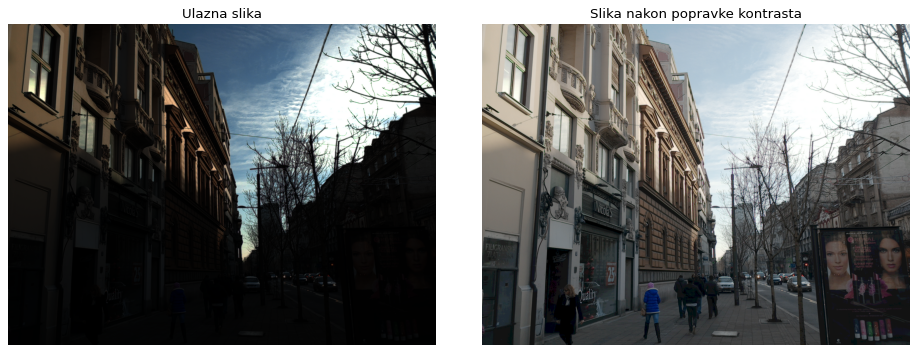

In [2097]:
image_log = log_transform(raw_1, 100)

pictures_plot(raw_1, image_log)

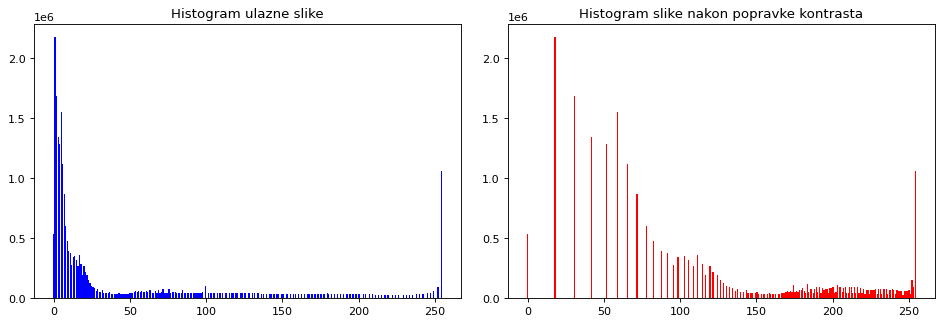

In [2098]:
hist_plot(raw_1, image_log)

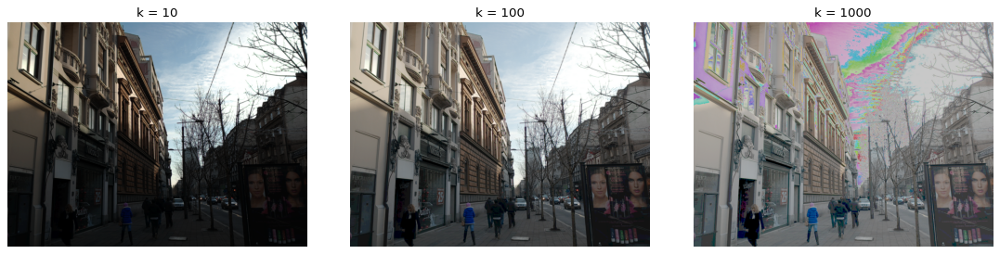

In [2100]:
#prikaz radi poredjenja uticaja različitih vrednosti parametra k
image_log_10 = log_transform(raw_1, 10)
image_log_100 = log_transform(raw_1, 100)
image_log_1000 = log_transform(raw_1, 1000)

pictures_plot_3(image_log_10, image_log_100, image_log_1000, 'k = 10', 'k = 100', 'k = 1000')

Analizom različitih vrednosti za parametr k, izabrana je optimalna vrednost 100.

### 4. Stepena funkcija 

$$s = r^{c},$$ 
gde je potrebno podesiti parametar c.

In [2101]:
def gamma_transform(f, c):
    g = f.copy()

    #transformacija na sva 3 kanala
    g[:,:,0] = 255*(f[:,:,0]/255)**c
    g[:,:,1] = 255*(f[:,:,1]/255)**c
    g[:,:,2] = 255*(f[:,:,2]/255)**c
    
    return g

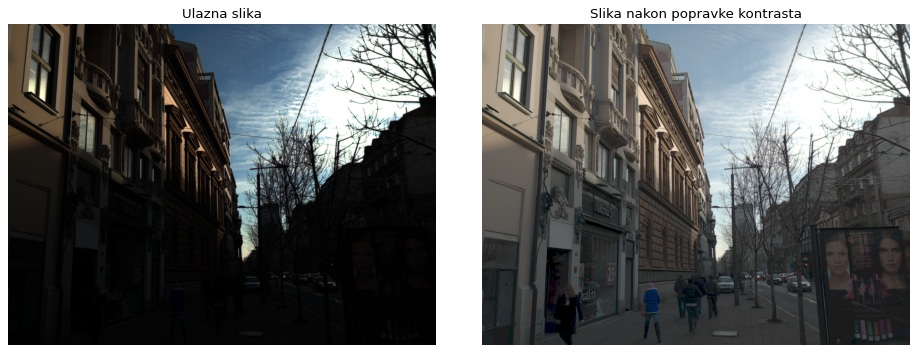

In [2102]:
image_gamma = gamma_transform(raw_1, 0.4)
pictures_plot(raw_1, image_gamma)

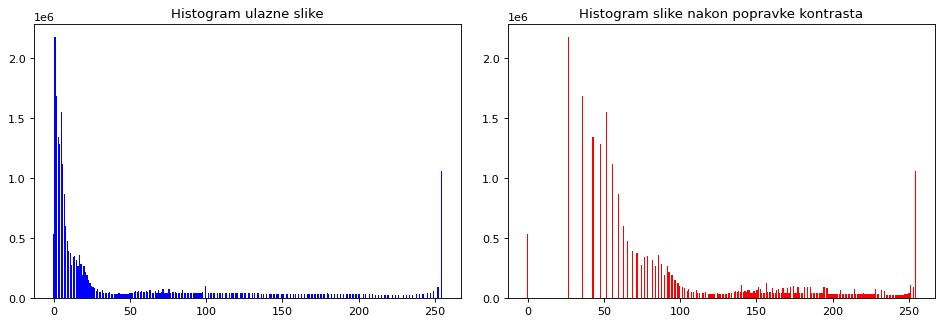

In [2103]:
hist_plot(raw_1, image_gamma)

Posmatranjem funkcije  preslikavanja u zavisnosti od parametra $c$ i potrebom da se manji opseg tamnih piksela preslika u svetli, da se zaključiti da će $c<1$ dati krivu koja se nalazi u gornjoj polovini (što znači da se manji opseg tamnih piksela ulazne slike razvlači u veći). Posmatranjem histograma i isporobavanjem različitih vrednosti izabrana je vrednost $0.4$.

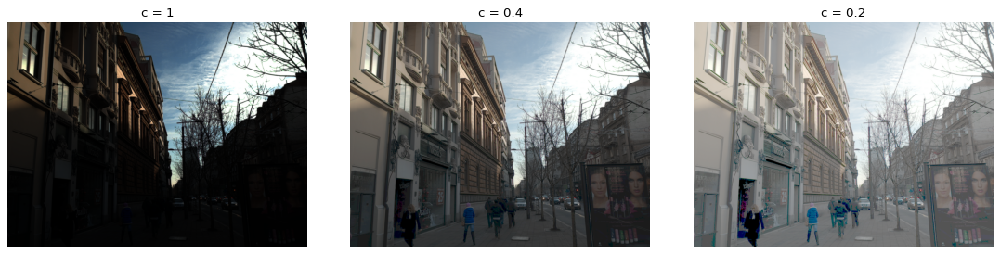

In [2108]:
# prikaz radi poredjenja uticaja različitih vrednosti parametra c
image_gamma_1 = gamma_transform(raw_1, 1)
image_gamma_04 = gamma_transform(raw_1, 0.4)
image_gamma_02 = gamma_transform(raw_1, 0.2)

pictures_plot_3(image_gamma_1, image_gamma_04, image_gamma_02, 'c = 1', 'c = 0.4', 'c = 0.2')

### Čuvanje najboljeg rešenja u izlazni fajl

Primećuje se da razvlačenje kontrasta sa linearnim segmentima daje znatno bolje rezultate nego odsecanje. Pošto želimo da razvučemo vrednosti tamnih piksela, kod odsecanja moramo krenuti od nule, ali onda veliki deo piksela koji su svetliji odlaze u saturaciju i postaju skroz beli. Razvlačenje kontrasta sa linearnim segmentima ovaj problem bolje kontroliše jer se takođe pikseli na granicama mogu zasebno razvući.   
Kompresija kontrasta log i stepenom funkcijom daju dosta bolje rezultate jer simuliraju funkciju našeg vizuelnog sistema. One su inverzne, pa se samo drugačijim vrednostima parametara dobijaju slični rezultati.   
Kao najbolji rezultat, izabran je rezultat logaritamske funkcije.

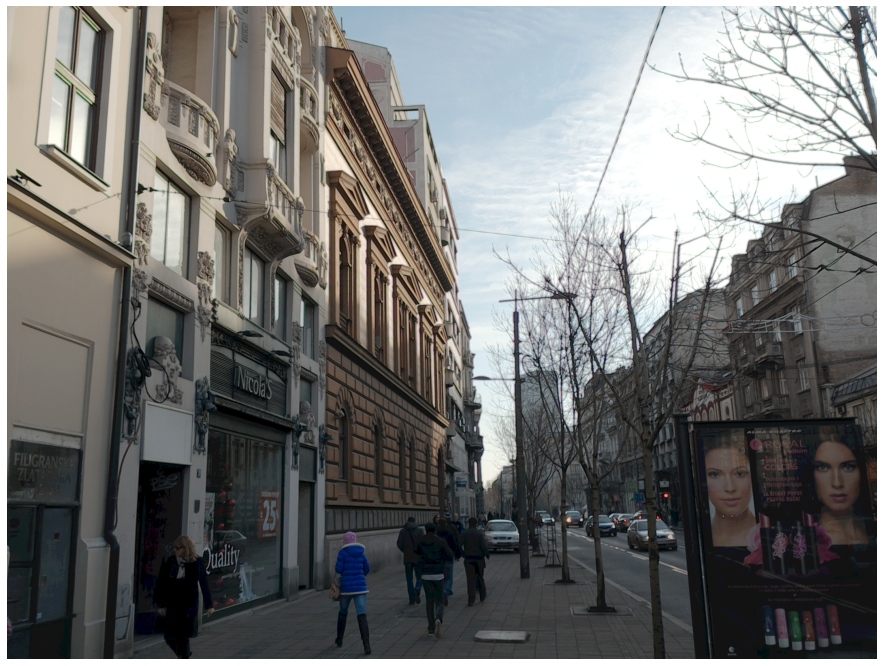

In [2111]:
image_log_unit8 = image_log.astype('uint8')
plt.figure(figsize=(24,12))
plt.imshow(image_log_unit8)
plt.axis('off');
plt.show()

# cuvanje slike
io.imsave('street_out.tif', image_log_unit8)

# Drugi zadatak - izoštravanje slike

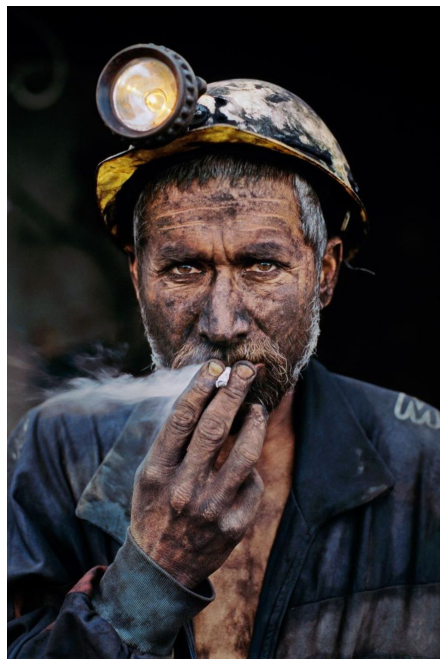

In [2128]:
# ucitavanje slike
raw_2 = io.imread('../sekvence/miner.jpg')
# skaliranje na opseg [0,255]
raw_2[:,:,0] = raw_2[:,:,0]/max(raw_2[:,:,0].flatten())*255
raw_2[:,:,1] = raw_2[:,:,1]/max(raw_2[:,:,1].flatten())*255
raw_2[:,:,2] = raw_2[:,:,2]/max(raw_2[:,:,2].flatten())*255
# prikaz slike
figure(figsize=(24,12))
imshow(raw_2, vmin=0, vmax=255) 
axis('off');

### Postupak izoštravanja

Prvo je potrebno prebaciti sliku u YUV formatu (Y - svetlina i UV - čistoća/jasnoća boja). Zatim se operacije rade na Y kanalu.

In [2112]:
raw_yuv = color.rgb2yuv(raw_2)
raw_y = raw_yuv[:,:,0]

Izoštravanje slike podrazumeva isticanja ivice na slici, tačnije isticanje visokih učestanosti. Primenjena metoda oslanja se na korišćenje Laplasijana.

In [2113]:
# definisanje nekih prostornih maski za izostrenje
mask_1 = np.array([[-1, -1, -1], [-1, 8, -1], [-1, -1, -1]])
mask_2 = [[0, -1, 0], [-1, 4, -1], [0, -1, 0]]

In [2114]:
# odredjivanje laplasijana
img_lap = ndimage.correlate(raw_y, mask_1)

In [2115]:
# dodavanje izdvojenih ivica na sliku + skaliranje
c = 0.5
img_sharp = raw_y + c*img_lap

In [2116]:
# isecanje vrednosti manjih i vecih od opsega
img_sharp = np.clip(img_sharp, 0, 1)
# zamena sa kanalom vece ostrine
ra_yuv_copy = raw_yuv.copy()
ra_yuv_copy[:,:,0] = img_sharp
# konverzija u RGB
img_sharp = color.yuv2rgb(ra_yuv_copy)
img_sharp = np.clip(img_sharp, 0, 1)

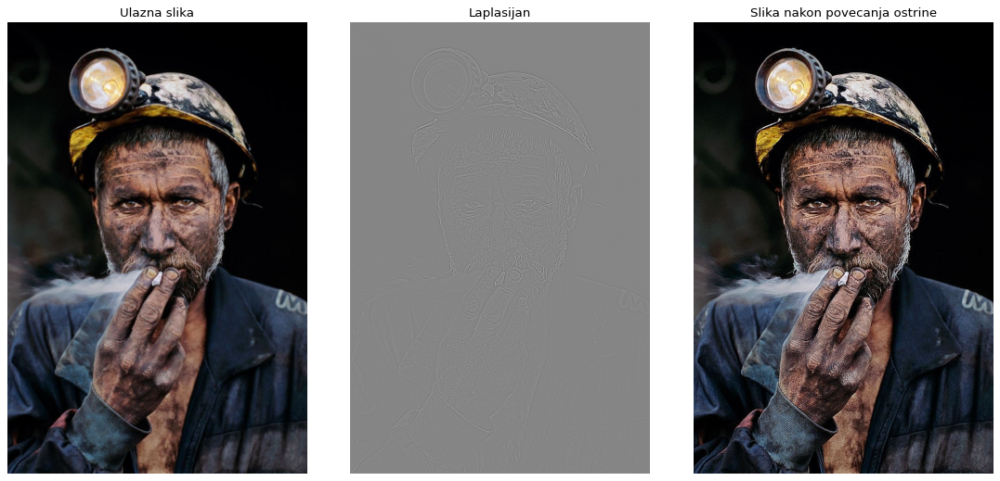

In [2117]:
# prikaz svih slika u procesu povecanja ostrine
pictures_plot_3(raw_2, img_lap, img_sharp, 'Ulazna slika', 'Laplasijan', 'Slika nakon povecanja ostrine')

Laplasijan predstavlja traženje drugog izvoda slike, tačnije posmatra promenu prvog izvoda slike. To se jednostavnije može objasniti kao traženje brzine promene osvetljenosti piksela, kako bismo detektovali da li je promena kontinualna ili nagla. Nagle promene jesu ivice, i one predstavljaju visoke frekvencije slike. Njihovim dodatnim pojačanjem dobijamo oštriju sliku, i to se kod ovog pristupa postiže sabiranjem slike dobijene primenom prostorne maske i početne slike.    
Ispitana su dejstva dve uobičajene prostorne maske i nisu uočene prevelike razlike. Takođe, variran je i koeficijent prilikom pojačavanja ivica. Ispod se mogu videti neki primeri i analiza unošenja šuma.

In [2119]:
# objedinjenje prethodnih koraka u funkciju

def laplas_izostravanje(mask_1 = mask_1, c = 1):
    # odredjivanje laplasijana
    img_lap = ndimage.correlate(raw_y, mask_1)
    # dodavanje izdvojenih ivica na sliku + skaliranje
    img_sharp = raw_y + c*img_lap
    # isecanje vrednosti manjih i vecih od opsega
    img_sharp = np.clip(img_sharp, 0, 1)
    # zamena sa kanalom vece ostrine
    ra_yuv_copy = raw_yuv.copy()
    ra_yuv_copy[:,:,0] = img_sharp
    # konverzija u RGB
    img_sharp = color.yuv2rgb(ra_yuv_copy)
    img_sharp = np.clip(img_sharp, 0, 1)
    return img_sharp

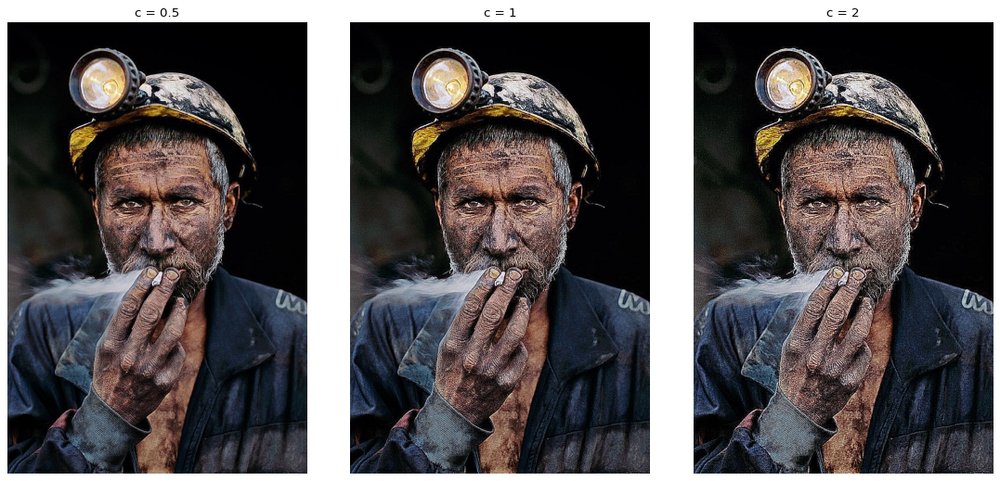

In [2120]:
pictures_plot_3(laplas_izostravanje(c=0.5), laplas_izostravanje(c=1), laplas_izostravanje(c=2), 'c = 0.5', 'c = 1', 'c = 2')

Posmatranjem histograma, kao i posmatranjem slika iznad, lako se da zaključiti da je koncentracija šuma značajno porasla. Za $c=2$ koncentracija šuma je veoma velika, za sliku $c=1$ ona je na granici, a izbor koji predlažem kao adekvatan je vrednost $0.5$.

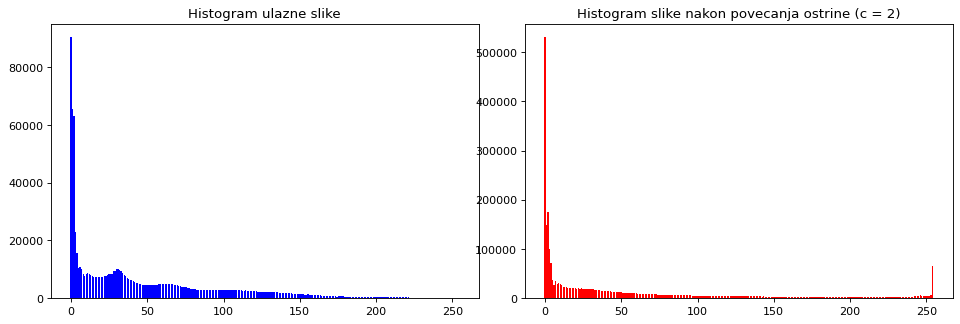

In [2122]:
# analiza velike koncentracije suma posmatranjem histograma
hist_plot(raw_y*255, laplas(c=2)*255, 'Histogram ulazne slike', 'Histogram slike nakon povecanja ostrine (c = 2)')

### Čuvanje najboljeg rešenja u izlazni fajl

In [2124]:
io.imsave('miner_sharp.jpg', (img_sharp*255).astype('uint8'))

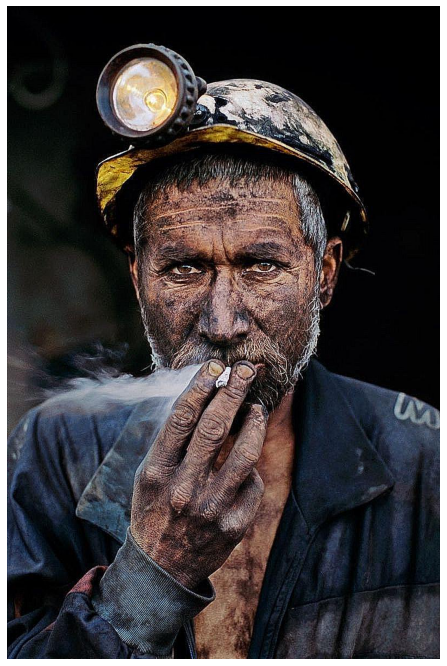

In [2125]:
# prikaz sacuvane slike radi provere
miner_sharp = io.imread('miner_sharp.jpg')
figure(figsize=(24,12))
imshow(miner_sharp)
axis('off');
show();

# Treći zadatak - Adaptivna ekvalizacija histograma uz ograničenje kontrasta

In [2132]:
# ucitavanje slike
raw_3 = io.imread('../sekvence/train.jpg')
# skaliranje na opseg [0,255]
raw_3[:,:,0] = raw_3[:,:,0]/max(raw_3[:,:,0].flatten())*255
raw_3[:,:,1] = raw_3[:,:,1]/max(raw_3[:,:,1].flatten())*255
raw_3[:,:,2] = raw_3[:,:,2]/max(raw_3[:,:,2].flatten())*255

Pre samog postupka potrebno je konvertovati sliku u YUV format i izdvojiti Y kanal, kako bi se na njemu vršila popravka osvetljenosti

In [2137]:
raw_3_yuv = color.rgb2yuv(raw_3)
raw_3_y = raw_3_yuv[:,:,0]
raw_3_y = raw_3_y * 255

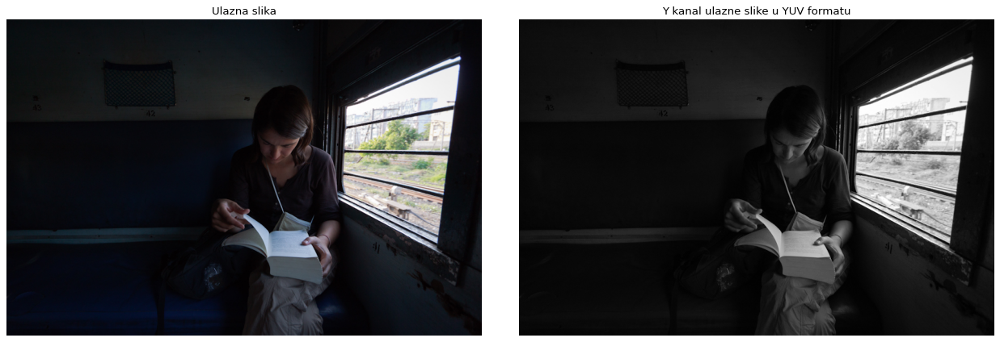

In [2136]:
# prikaz originalne slike i Y kanala (osvetljenosti)
fig, ax = plt.subplots(ncols=2, figsize=(16,8), dpi=80); plt.tight_layout()
ax[0].imshow(raw_3); ax[0].set_title('Ulazna slika'); ax[0].axis('off')
ax[1].imshow(raw_3_y, "gray"); ax[1].set_title('Y kanal ulazne slike u YUV formatu'); ax[1].axis('off');

Kako nije dozvoljeno koristiti ugrađenu, potrebno je implementirati funkciju za prikaz histograma slike

In [2138]:
def histogram(image, bins = 256, range_l = 0, range_r = 255):

    # spustanje slike u jednu dimenziju
    image_flattened = image.flatten()

    # definisanje osa
    x_axis = np.linspace(range_l, range_r, bins)
    y_axis = np.zeros(bins)

    # definisanje koraka
    dt = x_axis[1] - x_axis[0]
    
    # popunjavanje y ose
    for elem in image_flattened:
        y_axis[int(elem/dt)] += 1
    
    y_axis = y_axis / len(image_flattened)

    return x_axis, y_axis

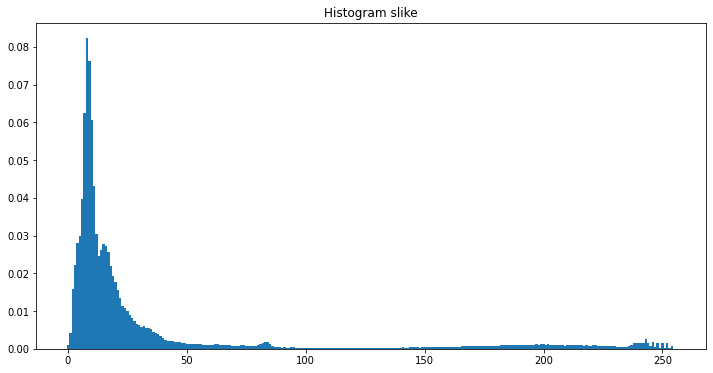

In [2140]:
# racunanje histograma Y kanala originalne slike
x, originalni_histogram = histogram(raw_3_y)

# njegov prikaz
plt.figure(figsize=(12, 6))
plt.bar(x, originalni_histogram, width=1)
plt.title('Histogram slike')
plt.show()

Zbog razlike u broju tamno i svetlo osvetljenih piksela, uvodi se razmišljanje kako trensformisati histogram, tako da on postane uniformo raspoređen. Kumulativnim histogramom, kojim predstavljamo kumulativnu funkciju raspodele, možemo mapirati vrednosti originalne slike u broj odbiraka koji imaju vrednosti manje od trenutne. Na našem konkretnom primeru, veliki broj tamnih piksela koji se nalaze na početku, rezultovaće strmim kumulativnim histogramom u tom delu, koji će date vrednosti preslikavati u širem opsegu.

Funkcija za ekvalizaciju histograma slike implementirana je u nastavku, a uz kod je i objašnjen postupak

In [2148]:
def ekvalizacija_histograma(image, hist):

    suma_pr = 0              # suma se na pocetku inicjalizuje na 0
    L = len(hist)
    s = np.zeros(L)          # inicijalizuje se niz u koji se stavljaju sume do
                             # datog elementa, kako bi naredno racunanje bilo brze
    s_rounded = np.zeros(L)  # niz za zaokruzene vrednosti 

    for br in range(len(hist)):          # prolazak kroz histogram 
        suma_pr += hist[br]              # racunanje broja odbiraka do odredjene vrednosti
        s[br] = (L-1)*suma_pr
        s_rounded[br] = round(s[br])     # racunanje funkcije preslikavanja po formuli

    new_image = image.copy()
    for i in range(len(image)):          # formiranje izlazne slike na osnovu funkcije preslikavanja
        for j in range(len(image[i])):
            new_image[i][j] = s_rounded[int(image[i][j])]
        
    return new_image

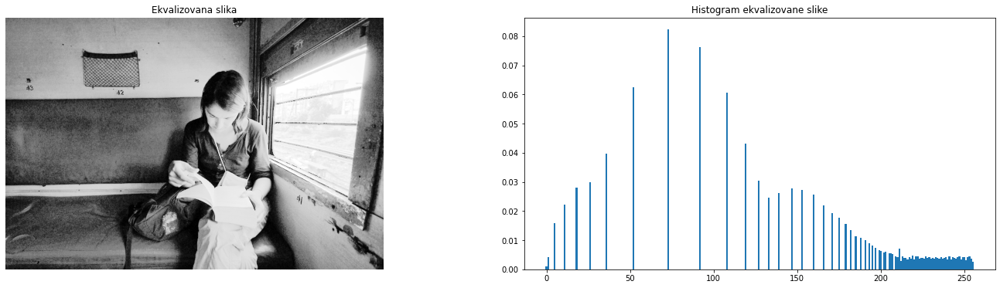

In [2149]:
# primenjivanje ekvalizacije histograma na Y kanal originalne slike
raw_3_y_eq = ekvalizacija_histograma(raw_3_y, originalni_histogram)

# prikaz rezultata
figure(figsize=(24,6))
plt.subplot(1,2,1)
imshow(raw_3_y_eq, 'gray', vmin=0, vmax=255)
axis('off');
plt.title('Ekvalizovana slika')
plt.subplot(1,2,2)
plt.bar(histogram(raw_3_y_eq)[0], histogram(raw_3_y_eq)[1], width=1)
plt.title('Histogram ekvalizovane slike')
plt.show()

Kao što se primećuje sa slike, određeni delovi postali su prenaglašeni. Da bismo izbegli tu pojavu, potrebno je ograničiti strminu kumulativnog histograma (funkcije preslikavanja). To se postiže odsecanjem, tačnije, ograničenjem maksimalne vrednosti histograma. Sve odbirke koji prelaze limit potrebno je uniformno raspodeliti u okviru celog histograma.

In [2150]:
def clip_limit(hist, clip_limit = 1):
    
    hist1 = hist.copy()

    all_above = 0                                      # broj odbiraka iznad clip_limit-a
    for i in range(len(hist)):
        if hist[i] > clip_limit:                       # ako je vrednost veca od clip_limit-a
            all_above += hist[i] - clip_limit          # svi koji prelaze preko ulaze u sumu
            hist1[i] = clip_limit                      # maksimalna vrednost se postavlja na clip_limit

    hist1 += all_above/len(hist1)                      # dodavanje preostalih odbiraka na sve vrednosti

    return hist1

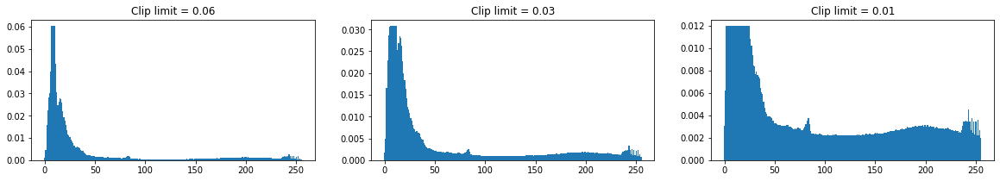

In [2151]:
# prikaz histograma nakon primene različitih vrednosti clip_limit-a
hist_clipped_1 = clip_limit(originalni_histogram, 0.06)
hist_clipped_2 = clip_limit(originalni_histogram, 0.03)
hist_clipped_3 = clip_limit(originalni_histogram, 0.01)

# prikaz 3 histograma na subplotu
plt.figure(figsize=(20, 3))
plt.subplot(1, 3, 1)
plt.bar(x, hist_clipped_1, width=1)
plt.title('Clip limit = 0.06')
plt.subplot(1, 3, 2)
plt.bar(x, hist_clipped_2, width=1)
plt.title('Clip limit = 0.03')
plt.subplot(1, 3, 3)
plt.bar(x, hist_clipped_3, width=1)
plt.title('Clip limit = 0.01')
plt.show()

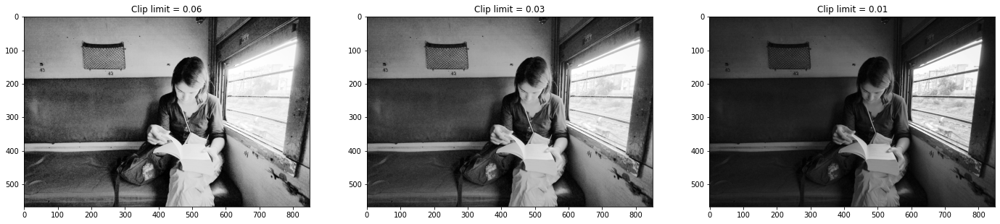

In [2152]:
# prikaz slika dobijenih ekvalizacijom histograma sa različitim clip_limit-om
raw_3_y_eq_clipped_1 = ekvalizacija_histograma(image = raw_3_y, hist = hist_clipped_1)
raw_3_y_eq_clipped_2 = ekvalizacija_histograma(image = raw_3_y, hist = hist_clipped_2)
raw_3_y_eq_clipped_3 = ekvalizacija_histograma(image = raw_3_y, hist = hist_clipped_3)

# prikaz 3 slike na subplotu
plt.figure(figsize=(24, 6))
plt.subplot(1, 3, 1)
plt.imshow(raw_3_y_eq_clipped_1, 'gray', vmin=0, vmax=255)
plt.title('Clip limit = 0.06')
plt.subplot(1, 3, 2)
plt.imshow(raw_3_y_eq_clipped_2, 'gray', vmin=0, vmax=255)
plt.title('Clip limit = 0.03')
plt.subplot(1, 3, 3)
plt.imshow(raw_3_y_eq_clipped_3, 'gray', vmin=0, vmax=255)
plt.title('Clip limit = 0.01')
plt.show()

Primećuje se da od posmatranih najbolji rezultat daje clip_limit od 0.01, međutim ni on nije savršen. Slika je previše zatamnjena u odnosu na prozor, i to je cena koju moramo platiti zarad delimičnog očuvanja detalja u svetlom delu slike. Međutim, u tome i jeste problematika ovog zadatka, tako da se pribegava pristupu adaptivne ekvalizacije histograma.

In [2154]:
# transformaciona funkcija koja će u narednim koracima biti neopphodna predstavlja kumulativnu funkciju histograma
# kao što je prethodno i pomenuto, i ona je definisana na sledeći način

def kumulativna_funkcija_histograma(hist_clipped):
    suma_pr = 0                       # suma se na pocetku inicjalizuje na 0
    L = len(hist_clipped)
    s = np.zeros(L)                   # inicijalizuje se niz u koji se stavljaju sume do
                                      # datog elementa, kako bi naredno racunanje bilo brze
    s_rounded = np.zeros(L)           # niz zaokruzenih vrednosti

    for br in range(len(hist_clipped)):
        suma_pr += hist_clipped[br]   # racunanje broja odbiraka do odredjene vrednosti
        s[br] = (L-1)*suma_pr
        s_rounded[br] = round(s[br])  # racunanje funkcije preslikavanja po formuli
        
    return s_rounded

Funkcija za interpolaciju rešava prethodno diskutovani problem u stvaranju vidne razlike u osvevtljenosti piksela na granicama blokova. Ona je implementirana u nastavku.

In [2155]:
def funkcije_ekvalizacije_kockice(imgIn, numTiles = [8, 8], limit = 0.01):
    #imgIn - ulazna slike
    #numTiles - broj pravougaonika po x i y osi
    #limit - clip limit

    rest_y = numTiles[0] - imgIn.shape[0] % numTiles[0]              # broj piksela koji nedostaju po y osi da bi se dobio celobrojni pravougaonik
    rest_x = numTiles[1] - imgIn.shape[1] % numTiles[1]              # broj piksela koji nedostaju po x osi da bi se dobio celobrojni pravougaonik
    imgOut = imgIn.copy()

    for i in range (rest_y):
        imgOut = np.concatenate((imgOut, imgOut[-1:, :]), axis = 0)  # dodavanje piksela na x osu (ponavljanjem poslednjeg reda)
    for i in range (rest_x):
        imgOut = np.concatenate((imgOut, imgOut[:, -1:]), axis = 1)  # dodavanje piksela na y osu (ponavljanjem poslednje kolone)

    step_x = imgOut.shape[1] // numTiles[1]                          # duzina stranice pravougaonika po x osi
    step_y = imgOut.shape[0] // numTiles[0]                          # duzina stranice pravougaonika po y osi

    T_all = []                                                       # definisanje matrice u koji ce se smestati kumulativne funkcije histograma

    for i in range (numTiles[0]):
        t_x = []
        for j in range (numTiles[1]):
            start_y = i*step_y                                       # pocetak pravougaonika na y osi
            end_y = start_y + step_y                                 # kraj pravougaonika na y osi
            start_x = j*step_x                                       # pocetak pravougaonika na x osi
            end_x = start_x + step_x                                 # kraj pravougaonika na x osi
            image = imgOut[start_y:end_y, start_x:end_x]             # izdvajanje slike unutar tog pravougaonika

            x, hist = histogram(image)                               # racunanje histograma za izdvojenu sliku
            hist_clipped = clip_limit(hist, limit)                   # primena clip limita na histogram

            sk = kumulativna_funkcija_histograma(hist_clipped)             # racunanje kumulativne funkcije histograma

            t_x.append(sk)
        T_all.append(t_x)

    return T_all

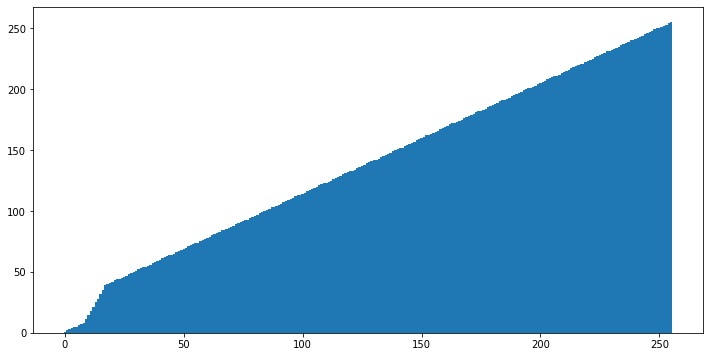

In [2157]:
# formiranje matrice kumulativnih funkcija histograma za neke parametre
svi_histogrami = funkcije_ekvalizacije_kockice(raw_3_y, numTiles = [8, 8], limit = 0.01)

# prikaz kumulativne funkcije histograma za prvi blok
hist1 = svi_histogrami[0][0]
x_ax = np.linspace(0, 255, 256)
plt.figure(figsize=(12, 6))
plt.bar(x_ax, hist1, width=1)
plt.show()

Pošto se histogrami različitih delova slike jako razlikuju (tamni i svetli deo), ideja je da se transformaciona funkcija računa posebno za svaki piksel. Usled stvaranja razlike kod susreta dva različita bloka slike, potrebno je računati transformaciju i na osnovu histograma okolnih regiona.

Implementirana je funkcija koja računa novu vrenost piksela na osnovu prethodnog metoda

In [2161]:
def interpolacija_piksela(image, i, j, x_start, y_start, x_end, y_end, y, x, all_histograms):
    # image - ulazna slika 
    # i, j - indeksi bloka
    # x_start, y_start - koordinate pocetka bloka
    # x_end, y_end - koordinate kraja bloka
    # y, x - koordinate piksela na slici
    # all_histograms - matrica kumulativnih funkcija histograma

    c_x = (x_end + x_start) / 2        # centar bloka po x osi
    c_y = (y_end + y_start) / 2        # centar bloka po y osi
    pixel = image[y][x]                # vrednost piksela
    T1, T2, T3, T4 = [], [], [], []    # inicijalizacija kumulativnih funkcija histograma okolnih blokova
    t1, t2, t3, t4 = 0, 0, 0, 0        # inicijalizacija vrednosti u koje se trenutni piksel preslikava 
                                       # preko kumulativnih funkcija histograma okolnih blokova

    if x < c_x and y < c_y:                                 # ako je piksel u gornjem levom delu bloka
        if i != 0 and j != 0:                               # ako postoji blok iznad i levo   
            T1 = all_histograms[i-1][j-1]                   # kumulativna funkcija histograma bloka iznad i levo
        if i != 0:                                          # ako postoji blok iznad
            T2 = all_histograms[i-1][j]                     # kumulativna funkcija histograma bloka iznad
        if j != 0:                                          # ako postoji blok levo 
            T3 = all_histograms[i][j-1]                     # kumulativna funkcija histograma bloka levo
        T4 = all_histograms[i][j]                           # kumulativna funkcija histograma trenutnog bloka
        
        a = x - x_start + (x_end - x_start) / 2             # udaljenost piksela od prvog centra sa leve strane 
        b = x_end - x - (x_end - x_start) / 2               # udaljenost piksela od prvog centra sa desne strane
        c = y - y_start + (y_end - y_start) / 2             # udaljenost piksela od prvog centra sa gornje strane
        d = y_end - y - (y_end - y_start) / 2               # udaljenost piksela od prvog centra sa donje strane

    elif x < c_x and y >= c_y:                              # ako je piksel u donjem levom delu bloka
        if j != 0:                                         
            T1 = all_histograms[i][j-1]                    
        T2 = all_histograms[i][j]                          
        if i != len(all_histograms)-1 and j != 0:          
            T3 = all_histograms[i+1][j-1]                 
        if i != len(all_histograms)-1:                    
            T4 = all_histograms[i+1][j]                    

        a = x - x_start + (x_end - x_start) / 2            
        b = x_end - x - (x_end - x_start) / 2             
        c = y - y_start - (y_end - y_start) / 2           
        d = y_end - y + (y_end - y_start) / 2              

    elif x >= c_x and y < c_y:                              # ako je piksel u gornjem desnom delu bloka
        if i != 0:                                        
            T1 = all_histograms[i-1][j] 	              
        if i != 0 and j != len(all_histograms[0])-1:      
            T2 = all_histograms[i-1][j+1]                
        T3 = all_histograms[i][j]                         
        if j != len(all_histograms[0])-1:                 
            T4 = all_histograms[i][j+1]                    

        a = x - x_start - (x_end - x_start) / 2            
        b = x_end - x + (x_end - x_start) / 2               
        c = y - y_start + (y_end - y_start) / 2           
        d = y_end - y - (y_end - y_start) / 2               

    elif x >= c_x and y >= c_y:                             # ako je piksel u donjem desnom delu bloka
        T1 = all_histograms[i][j]
        if j != len(all_histograms)-1:
            T2 = all_histograms[i][j+1]
        if i != len(all_histograms[0])-1:
            T3 = all_histograms[i+1][j]
        if i != len(all_histograms[0])-1 and j != len(all_histograms)-1:
            T4 = all_histograms[i+1][j+1]

        a = x - x_start - (x_end - x_start) / 2
        b = x_end - x + (x_end - x_start) / 2
        c = y - y_start - (y_end - y_start) / 2
        d = y_end - y + (y_end - y_start) / 2  

 
    if T1 != []:                          # ako postoje kumulativne funkcije onda se trazi nova vrednost piksela
        t1 = T1[int(pixel)]
    if T2 != []:
        t2 = T2[int(pixel)]
    if T3 != []:
        t3 = T3[int(pixel)]
    if T4 != []:
        t4 = T4[int(pixel)]


    sh1 = (b*t1 + a*t2) / (a + b)
    sh2 = (b*t3 + a*t4) / (a + b)

    s = (d*sh1 + c*sh2) / (c + d)       # nova vrednost piksela

    return s

In [2162]:
def dosCLAHE(imgIn, numTiles = [8, 8], limit = 0.01):
    # imgIn - ulazna slika
    # numTiles - broj pravougaonika po x i y osi
    # limit - clip limit
    if (limit < 0 or limit > 1 or len(numTiles)!=2 or numTiles[0] < 1 or numTiles[1] < 1):  # provera validnosti parametara
        print("Neki od unetih parametara je pogresan")
        return None

    velicina = len(imgIn.shape) # provera da li je slika 2d ili 3d

    if velicina == 3:           # ako je 3d, onda se slika konvertuje u YUV format i izvlaci se Y kanal
        raw_3_yuv = color.rgb2yuv(imgIn)
        raw_3_y = raw_3_yuv[:,:,0]
        raw_3_y = raw_3_y * 255
        imgIn = raw_3_y

    all_histograms = funkcije_ekvalizacije_kockice(imgIn, numTiles, limit)    # formiranje matrice kumulativnih funkcija histograma

    rest_y = numTiles[0] - imgIn.shape[0] % numTiles[0]        # broj piksela koji nedostaju po y osi da bi se dobio celobrojni pravougaonik
    rest_x = numTiles[1] - imgIn.shape[1] % numTiles[1]        # broj piksela koji nedostaju po x osi da bi se dobio celobrojni pravougaonik
    imgOut = imgIn.copy()

    for i in range (rest_y):                                   # dodavanje piksela
        imgOut = np.concatenate((imgOut, imgOut[-1:, :]), axis = 0)
    for i in range (rest_x):
        imgOut = np.concatenate((imgOut, imgOut[:, -1:]), axis = 1)

    imgOut1 = imgOut.copy()

    step_x = imgOut.shape[1] // numTiles[1]                    # duzina stranice pravougaonika po x osi
    step_y = imgOut.shape[0] // numTiles[0]                    # duzina stranice pravougaonika po y osi

    for i in range (numTiles[0]):
        for j in range (numTiles[1]):
            start_y = i*step_y                                 # pocetak pravougaonika na y osi
            end_y = start_y + step_y                           # kraj pravougaonika na y osi
            start_x = j*step_x                                 # pocetak pravougaonika na x osi
            end_x = start_x + step_x                           # kraj pravougaonika na x osi
            image = imgOut[start_y:end_y, start_x:end_x]       # izdvajanje slike unutar tog pravougaonika

            for i_image in range(image.shape[0]):               # prolazak kroz piksele izdvojene slike
                for j_image in range(image.shape[1]):
                    x = start_x + j_image                       # koordinate piksela na slici
                    y = start_y + i_image

                    image[i_image][j_image] = interpolacija_piksela(imgOut, i, j, start_x, start_y, end_x, end_y, y, x, all_histograms) # nova vrednost piksela

            imgOut1[start_y:end_y, start_x:end_x] = image       # zamena izmenjene slike unutar bloka
    
    imgOut1 = imgOut1[0:imgIn.shape[0], 0:imgIn.shape[1]]       # isecanje slike na pocetnu velicinu
    
    if velicina == 3:                                           # ako je slika bila 3d, onda se vraca u RGB format
        raw_3_yuv[:,:,0] = imgOut1/255                          # Y kanal se menja i vraca u opseg [0,1]
        imgOut1 = color.yuv2rgb(raw_3_yuv)                      # konverzija u RGB
        imgOut1 = np.clip(imgOut1, 0, 1)                        # isecanje vrednosti manjih i vecih od opsega
            
    return imgOut1

U zadatku je zahtevano uporediti dužinu izvršavanja programa za različite veličine blokova, kao i vrednosti clip_limita. U nastavku su prikazani rezultati

In [2168]:
def merenje_vremena(velicina, granica):

    start_vreme = time.time()                                        # pocetak merenja vremena
    imge_1 = dosCLAHE(raw_3, numTiles = velicina, limit = granica)   # primena CLAHE
    end_vreme = time.time()                                          # kraj merenja vremena
    execution_time = end_vreme - start_vreme                         # vreme izvrsavanja
    execution_time_norm = execution_time/np.size(imge_1)             # normalizacija vremena izvrsavanja
    
    return imge_1, execution_time, execution_time_norm

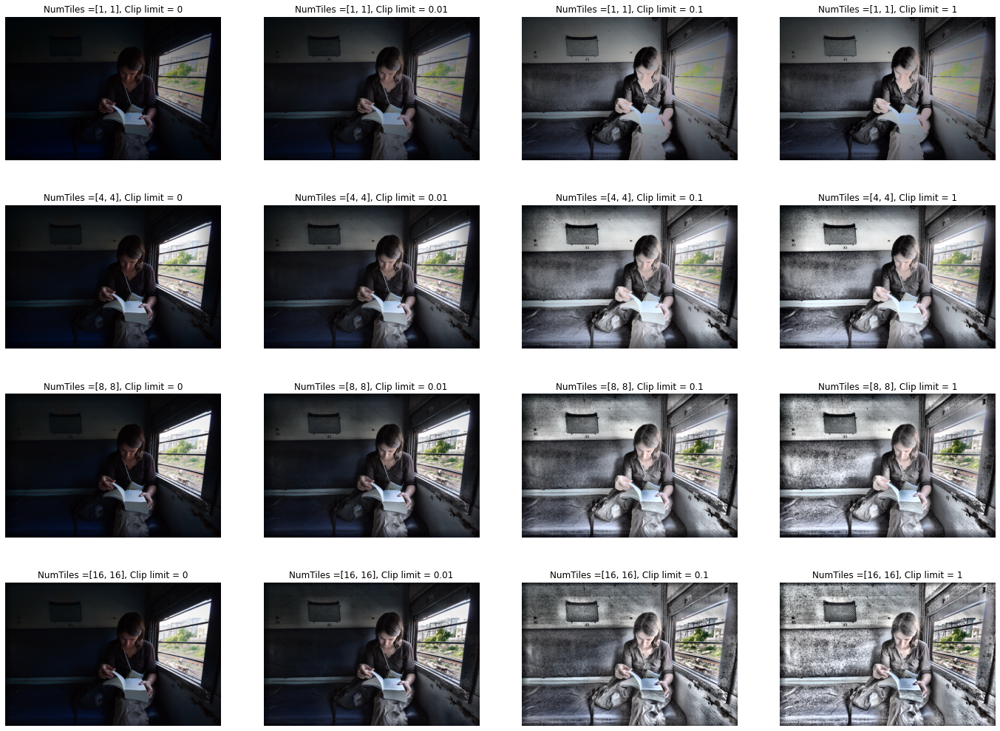

In [2169]:
velicine = [[1,1], [4,4], [8,8], [16,16]]                # razlicite velicine blokova
granice = [0, 0.01, 0.1, 1]                              # razlicite granice clip limit-a

plt.figure(figsize=(24, 18))
k = 0                                                    # brojac za subplot
time_for_all = []                                        # lista za cuvanje vremena izvrsavanja
time_for_all_norm = []                                   # lista za cuvanje normalizovanog vremena izvrsavanja

for i in velicine:
    for j in granice:
        k += 1                                           # povecavanje brojaca

        image_clahe, execution_time, execution_time_norm = merenje_vremena(i, j)  # primena CLAHE i merenje vremena izvrsavanja

        time_for_all.append(execution_time)                                 # dodavanje vremena izvrsavanja u listu 
        time_for_all_norm.append(execution_time_norm)                       # dodavanje normalizovanog vremena izvrsavanja u listu

        plt.subplot(4, 4, k)                                                # prikaz slike
        plt.imshow(image_clahe)
        plt.title('NumTiles =' + str(i) + ', Clip limit = ' + str(j))
        plt.axis('off')
        
plt.show()

Osmotrimo rezultate za različite parametre.          
Može se zaključiti da povećanjem dimenzije blokova slika postaje jasnija, kao i sami prelazi između. Dalji segmenti utiču na interpolaciju piksela, što dovodi do boljeg osvetljavanja (jer se brže stigne do segmenta na koji utiče neki histogram koji je svetljiji).           
Drastičnim povećanjem odsecanja dolazi do prevelike uravnoteženosti histograma i opaža se gubljenje poente inicijalne osvetljenosti slike. Dok premalim izborom vrednosti skoro da ni ne utičemo na promene.       
Rezultati za dimenzije [ 4, 4 ] i [ 8, 8 ], i klip limit 0.01 se izdvajaju kao najbolji.

In [2200]:
lim1 = np.mean([time_for_all[0], time_for_all[1], time_for_all[2], time_for_all[3]])
lim2 = np.mean([time_for_all[4], time_for_all[5], time_for_all[6], time_for_all[7]])
lim3 = np.mean([time_for_all[8], time_for_all[9], time_for_all[10], time_for_all[11]])
lim4 = np.mean([time_for_all[12], time_for_all[13], time_for_all[14], time_for_all[15]])

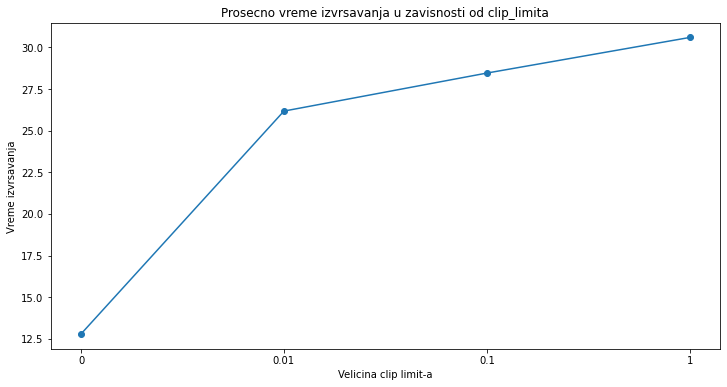

In [2202]:
# prikaz rezultata
plt.figure(figsize=(12, 6))
plt.plot(granice, [lim1, lim2, lim3, lim4], 'o-')
plt.xlabel('Velicina clip limit-a')
plt.ylabel('Vreme izvrsavanja')
plt.title('Prosecno vreme izvrsavanja u zavisnosti od clip_limita')
plt.show()

Na grafiku iznad vidi se zavisnost povećanja vremena izvršavanja koda i klip limita. 

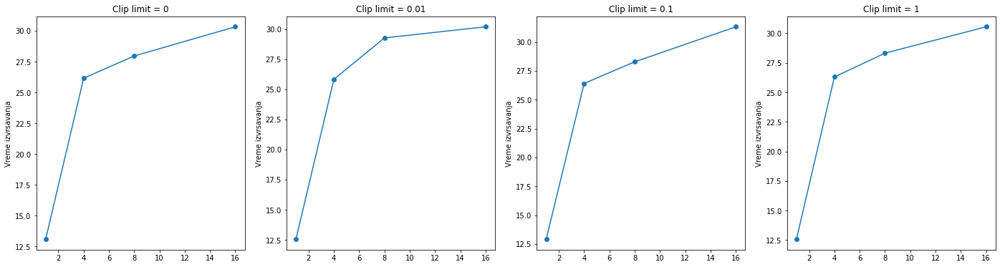

In [2206]:
blok1 = [time_for_all[0], time_for_all[4], time_for_all[8], time_for_all[12]]
blok2 = [time_for_all[1], time_for_all[5], time_for_all[9], time_for_all[13]]
blok3 = [time_for_all[2], time_for_all[6], time_for_all[10], time_for_all[14]]
blok4 = [time_for_all[3], time_for_all[7], time_for_all[11], time_for_all[15]]

velicine_blokova = [1, 4, 8, 16]
plt.figure(figsize=(24, 6))
plt.subplot(1, 4, 1)
plt.plot(velicine_blokova, blok1, 'o-')
plt.ylabel('Vreme izvrsavanja')
plt.title('Clip limit = 0')
plt.subplot(1, 4, 2)
plt.plot(velicine_blokova, blok2, 'o-')
plt.ylabel('Vreme izvrsavanja')
plt.title('Clip limit = 0.01')
plt.subplot(1, 4, 3)
plt.plot(velicine_blokova, blok3, 'o-')
plt.ylabel('Vreme izvrsavanja')
plt.title('Clip limit = 0.1')
plt.subplot(1, 4, 4)
plt.plot(velicine_blokova, blok4, 'o-')
plt.ylabel('Vreme izvrsavanja')
plt.title('Clip limit = 1')
plt.show()

Sa grafika možemo uočiti da vreme izvršavanja takođe raste sa povećanjem veličine bloka.

Sledi kod za upoređivanje vremena izvršavanja ugrađene i moje funkcije

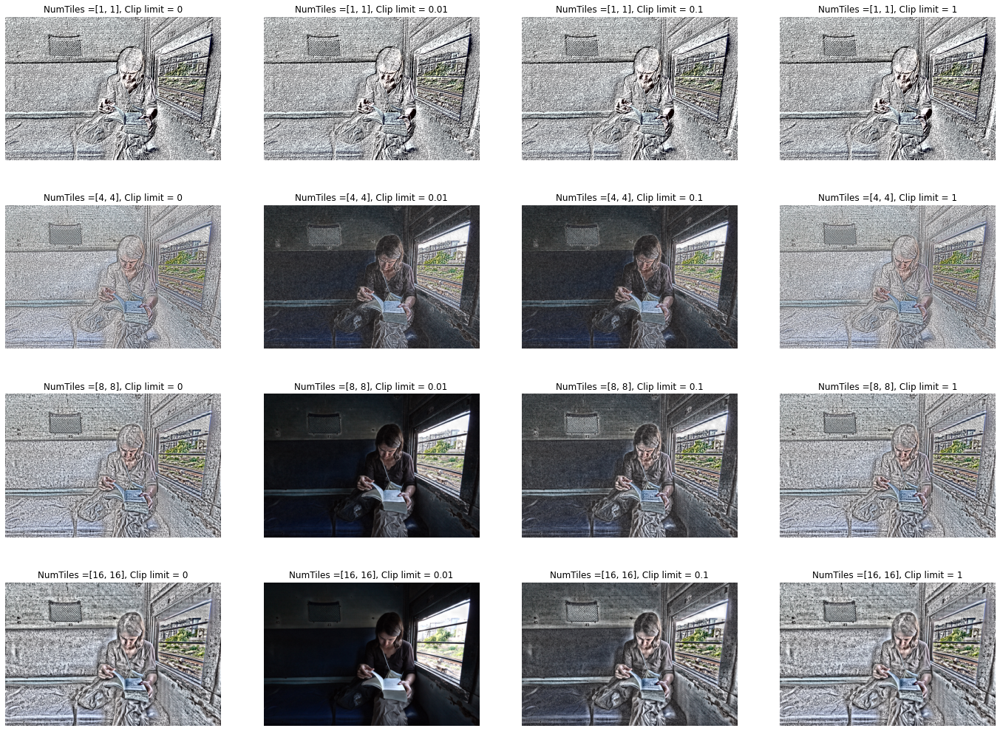

In [2220]:
velicine = [[1,1], [4,4], [8,8], [16,16]]                # razlicite velicine blokova
granice = [0, 0.01, 0.1, 1]                              # razlicite granice clip limit-a

plt.figure(figsize=(24, 18))
k = 0                                                    # brojac za subplot
time_for_all_funct = []                                  # lista za cuvanje vremena izvrsavanja
time_for_all_norm_funct = []                             # lista za cuvanje normalizovanog vremena izvrsavanja

for i in velicine:
    for j in granice:
        k += 1                                           # povecavanje brojaca

        start_vreme = time.time()          
        img_ybv = color.rgb2yuv(raw_3)
        img_y = img_ybv[:,:,0]
        imge_function = exposure.equalize_adapthist(img_y, kernel_size = i, clip_limit = j)
        img_ybv[:,:,0] = imge_function  
        img_rgb = color.yuv2rgb(img_ybv) 
        img_rgb = np.clip(img_rgb, 0, 1)                          
        end_vreme = time.time()                                         
        
        execution_time = end_vreme - start_vreme                         
        execution_time_norm = execution_time/np.size(imge_function)

        time_for_all_funct.append(execution_time)                           # dodavanje vremena izvrsavanja u listu 
        time_for_all_norm_funct.append(execution_time_norm)                 # dodavanje normalizovanog vremena izvrsavanja u listu

        plt.subplot(4, 4, k)                                                # prikaz slike
        plt.imshow(img_rgb)
        plt.title('NumTiles =' + str(i) + ', Clip limit = ' + str(j))
        plt.axis('off')
        
plt.show()

Možemo videti da se rešenja ugrađene funkcije razlikuju od mojih. Razlike se pripisuju drugačijoj implementaciji.       
Kao najbolje rešenje, ponovo se izdvaja ono sa parametrima [ 8, 8 ] i 0.01          
Pogledajmo sada razliku u vremenu.

In [2217]:
lim1_funct = np.mean([time_for_all_funct[0], time_for_all_funct[1], time_for_all_funct[2], time_for_all_funct[3]])
lim2_funct = np.mean([time_for_all_funct[4], time_for_all_funct[5], time_for_all_funct[6], time_for_all_funct[7]])
lim3_funct = np.mean([time_for_all_funct[8], time_for_all_funct[9], time_for_all_funct[10], time_for_all_funct[11]])
lim4_funct = np.mean([time_for_all_funct[12], time_for_all_funct[13], time_for_all_funct[14], time_for_all_funct[15]])

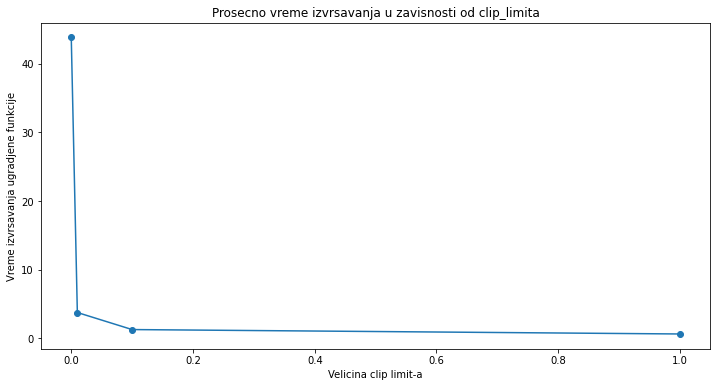

In [2218]:
# prikaz rezultata
plt.figure(figsize=(12, 6))
plt.plot(granice, [lim1_funct, lim2_funct, lim3_funct, lim4_funct], 'o-')
plt.xlabel('Velicina clip limit-a')
plt.ylabel('Vreme izvrsavanja ugradjene funkcije')
plt.title('Prosecno vreme izvrsavanja u zavisnosti od clip_limita')
plt.show()

Sa grafika se vidi da u proseku, ugrađena funkcija radi dosta brže zbog same efikasnosti implementacije.